In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import torchvision
from torchvision import transforms

In [2]:
torch.__version__

'1.9.0'

In [3]:
transform=transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,) , (0.5,))#均值和方差设为0.5就是将取值范围从0~1放到了-1~1
    ###注！！！！！Normalize不能直接(0.5,0.5) 要改成上面那样，推测是torch版本导致的
])

In [4]:
train_ds=torchvision.datasets.MNIST('data',train=True,transform=transform,download=True)

In [5]:
dataloader=torch.utils.data.DataLoader(train_ds,batch_size=64,shuffle=True)

## 定义生成器

In [6]:
imgs, la =next(iter(dataloader))

In [7]:
imgs.shape

torch.Size([64, 1, 28, 28])

In [8]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator,self).__init__()
        self.main=nn.Sequential( #使用sequntial来快速创建模型,直接按顺序写模型就行了
            nn.Linear(100,256),
            nn.ReLU(),
            nn.Linear(256,512),
            nn.ReLU(),
            nn.Linear(512,28*28),
            nn.Tanh()#根据经验，生成器一般使用tanh进行激活
        )
    def forward(self,x): #x表示长度为100的噪声输入
        img=self.main(x)
        img=img.view(-1,28,28)
        return img

## 定义判别器

In [9]:
class Discriminator(nn.Module):
    def __init__(self):
        super (Discriminator,self).__init__()
        self.main=nn.Sequential( 
            nn.Linear(28*28,512),
            nn.LeakyReLU(),  #leakyrelu 会在负值的时候保留一定的梯度不像relu负值就是0
            nn.Linear(512,256),
            nn.LeakyReLU(),
            nn.Linear(256,1),
            nn.Sigmoid()#最后的输出结果为0~1之间的概率，所以使用Sigmoid进行激活
        )
    def forward(self,x):
        x=x.view(-1,28*28)
        x=self.main(x)
        return x

## 初始化模型，优化器以及损失函数

In [10]:
device='cuda' if torch.cuda.is_available() else 'cpu'

In [11]:
gen=Generator().to(device)
dis=Discriminator().to(device) #初始化两个模型并且放到gpu上

In [12]:
d_optim=torch.optim.Adam(dis.parameters(),lr=0.0001)
g_optim=torch.optim.Adam(gen.parameters(),lr=0.0001)#定义判别器和生成器的优化器
loss_fn=torch.nn.BCELoss()#使用sigmoid激活的二分类模型损失函数使用BCEloss

## 绘图函数

In [18]:
def gen_image_plot(model,test_input): #test_input：每次给一个固定的随机数，看它的变化
    pre=np.squeeze(model(test_input).detach().cpu().numpy())#squeeze去掉值为1的维度，再将生成的预测结果放到cpu上  detch是将梯度截断，会得到一个没有梯度的tensor
    fig=plt.figure(figsize=(4,4))
    for i in range(16):
        plt.subplot(4,4,i+1)
        plt.imshow((pre[i]+1)/2) #imshow绘图有两个要求，要么是0~1之间的float 要不是0~255的int 但是生成器租后使用了tanh激活函数结果为-1~1，得化成0~1
        plt.axis('off')
    plt.show()#这样绘图就直接画出来了16张图


In [14]:
test_input= torch.randn(16,100, device=device) #因为想要生成16张，每张是一个100的噪声 必须加device否则会报错

## GAN的训练

In [19]:
D_loss=[]
G_loss=[]#建立两个空列表来存损失

Epoch: 0


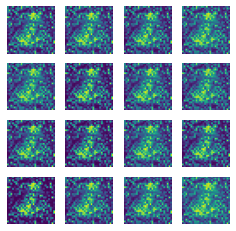

Epoch: 1


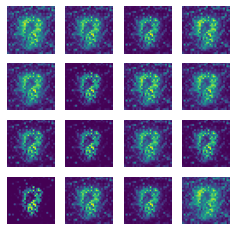

Epoch: 2


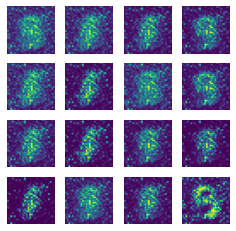

Epoch: 3


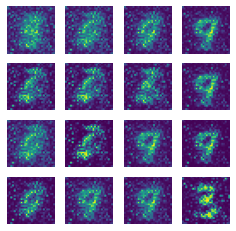

Epoch: 4


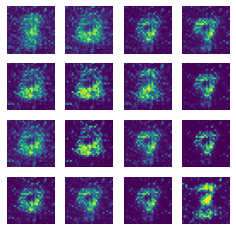

Epoch: 5


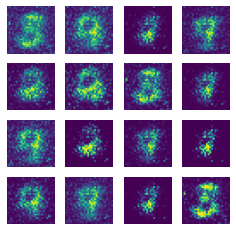

Epoch: 6


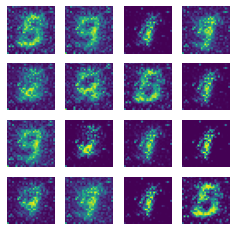

Epoch: 7


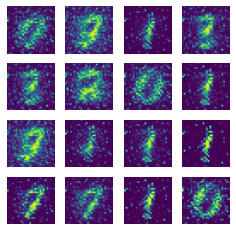

Epoch: 8


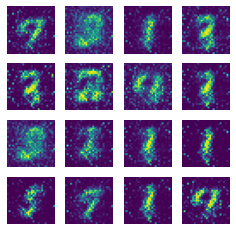

Epoch: 9


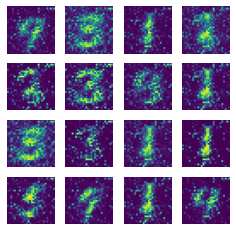

Epoch: 10


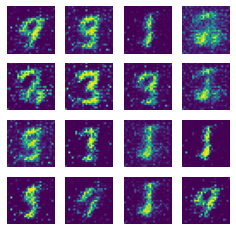

Epoch: 11


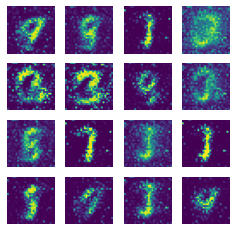

Epoch: 12


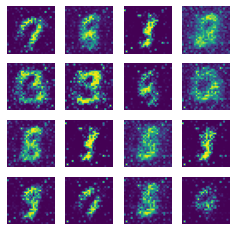

Epoch: 13


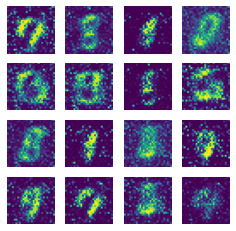

Epoch: 14


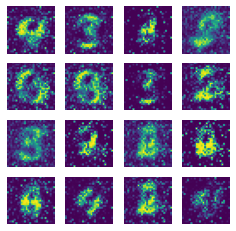

Epoch: 15


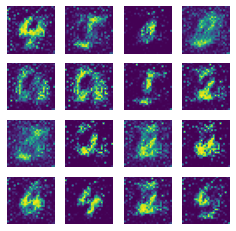

Epoch: 16


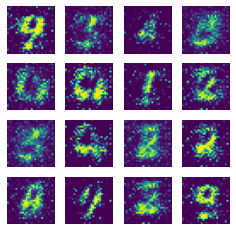

Epoch: 17


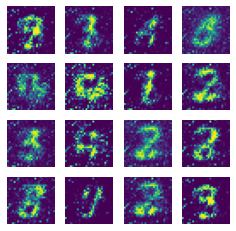

Epoch: 18


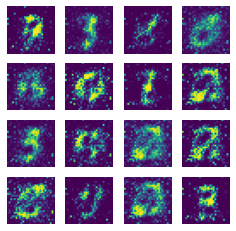

Epoch: 19


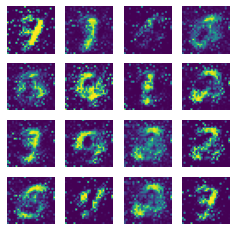

Epoch: 20


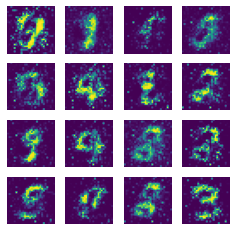

Epoch: 21


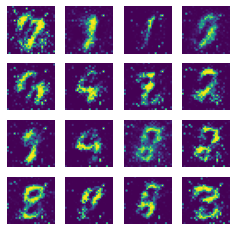

Epoch: 22


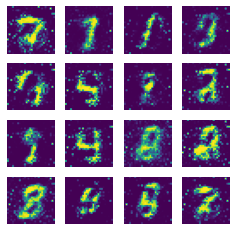

Epoch: 23


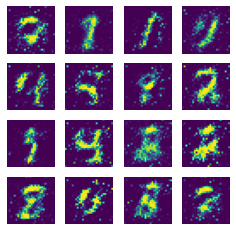

Epoch: 24


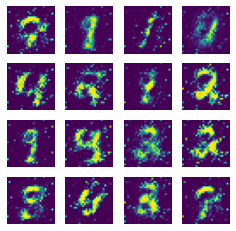

Epoch: 25


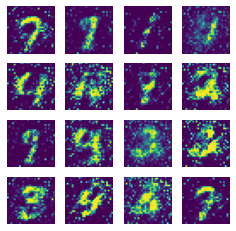

Epoch: 26


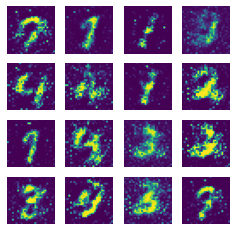

Epoch: 27


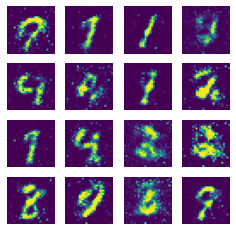

Epoch: 28


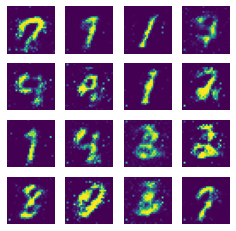

Epoch: 29


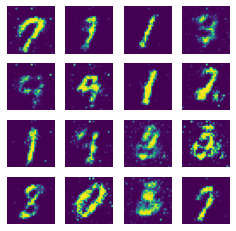

Epoch: 30


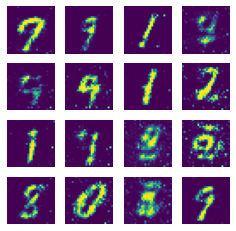

Epoch: 31


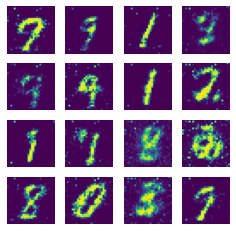

Epoch: 32


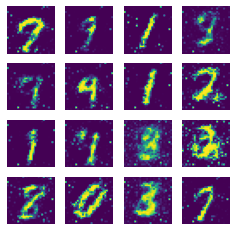

Epoch: 33


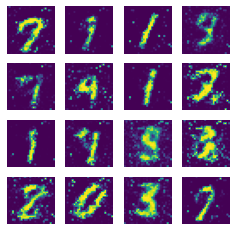

Epoch: 34


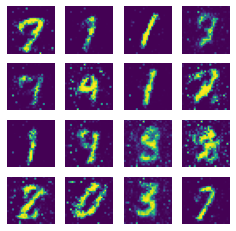

Epoch: 35


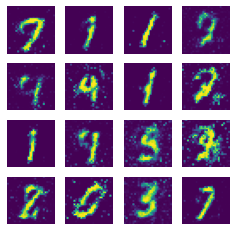

Epoch: 36


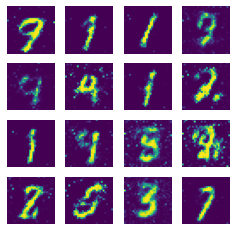

Epoch: 37


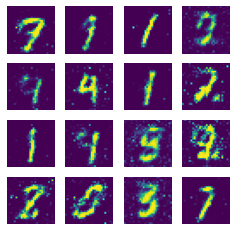

Epoch: 38


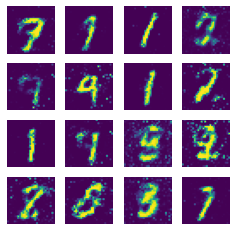

Epoch: 39


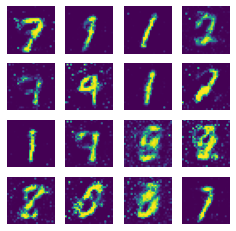

Epoch: 40


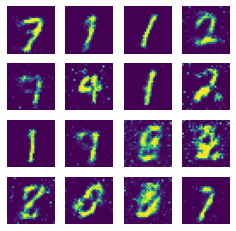

Epoch: 41


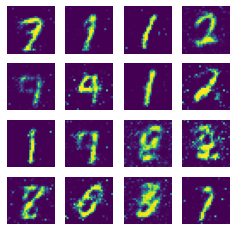

Epoch: 42


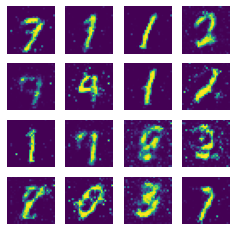

Epoch: 43


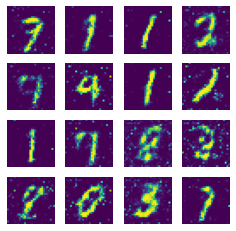

Epoch: 44


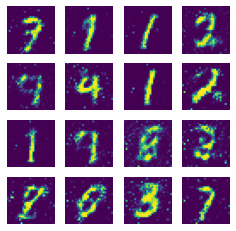

Epoch: 45


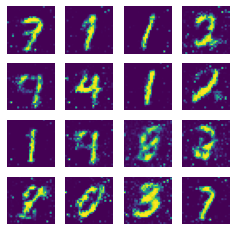

Epoch: 46


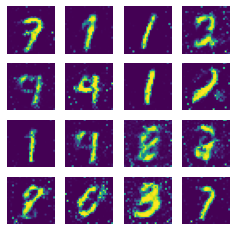

Epoch: 47


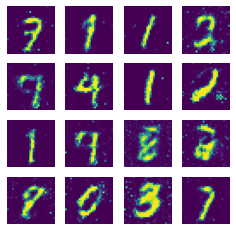

Epoch: 48


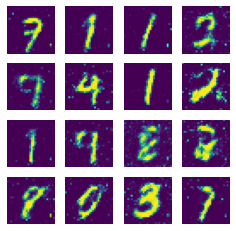

Epoch: 49


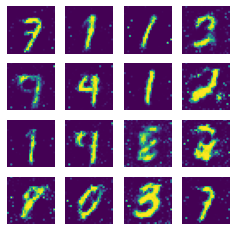

Epoch: 50


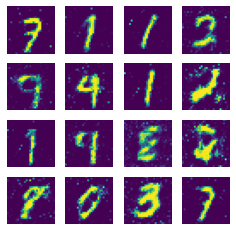

Epoch: 51


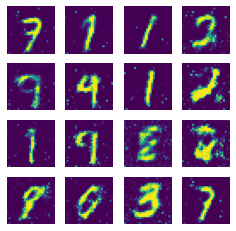

Epoch: 52


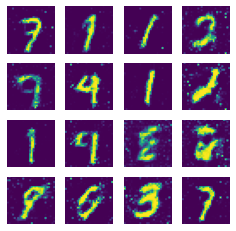

Epoch: 53


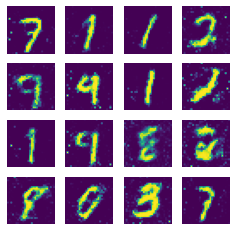

Epoch: 54


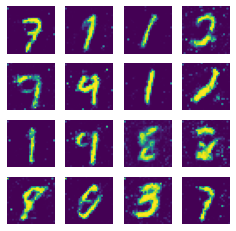

Epoch: 55


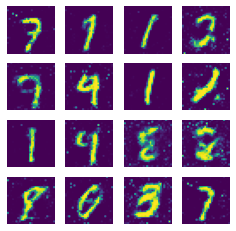

Epoch: 56


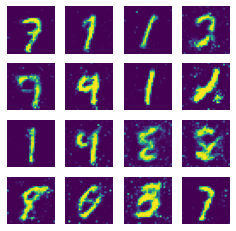

Epoch: 57


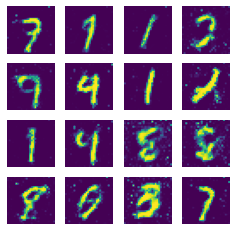

Epoch: 58


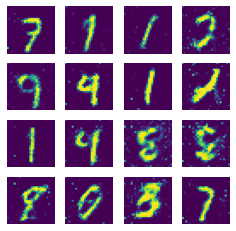

Epoch: 59


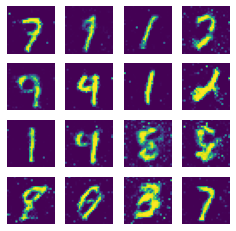

Epoch: 60


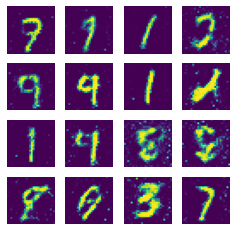

Epoch: 61


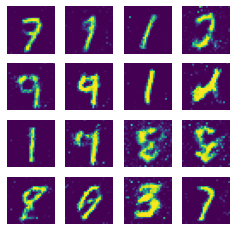

Epoch: 62


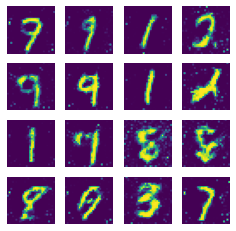

Epoch: 63


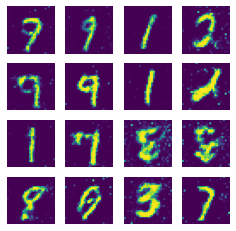

Epoch: 64


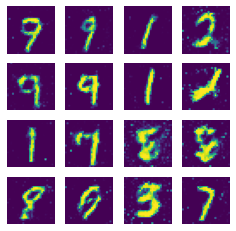

Epoch: 65


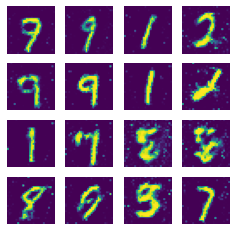

Epoch: 66


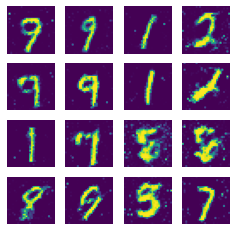

Epoch: 67


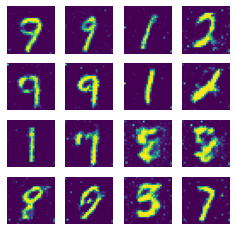

Epoch: 68


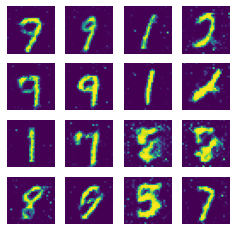

Epoch: 69


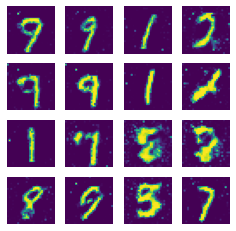

Epoch: 70


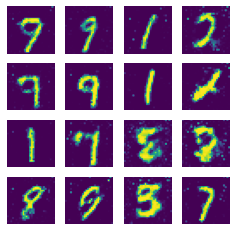

Epoch: 71


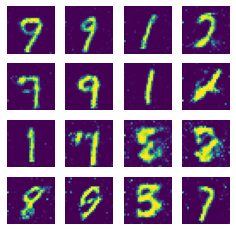

Epoch: 72


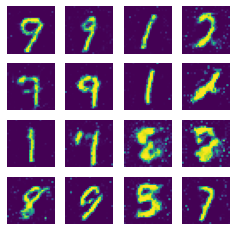

Epoch: 73


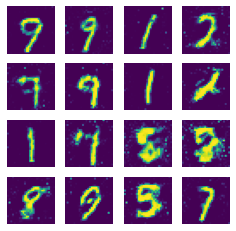

Epoch: 74


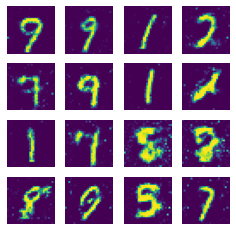

Epoch: 75


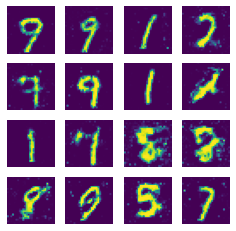

Epoch: 76


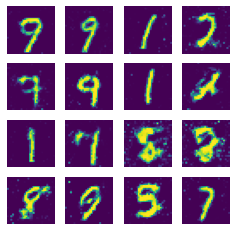

Epoch: 77


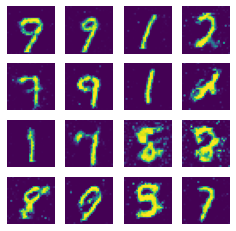

Epoch: 78


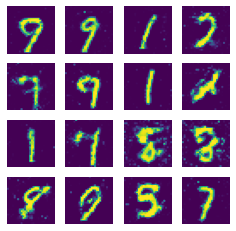

Epoch: 79


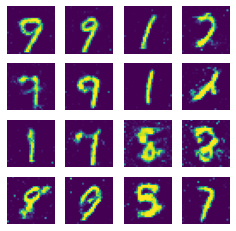

Epoch: 80


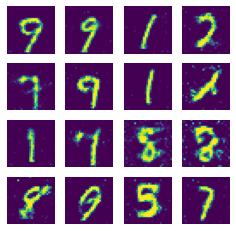

Epoch: 81


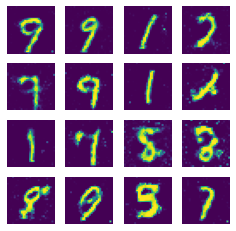

Epoch: 82


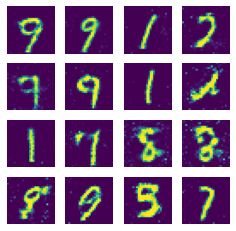

Epoch: 83


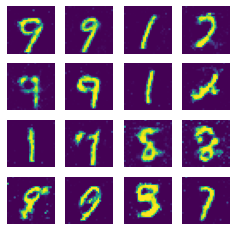

Epoch: 84


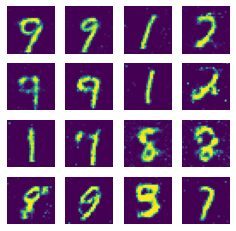

Epoch: 85


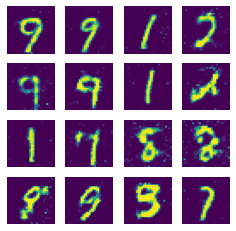

Epoch: 86


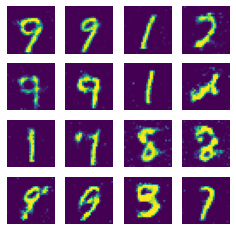

Epoch: 87


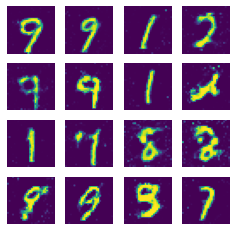

Epoch: 88


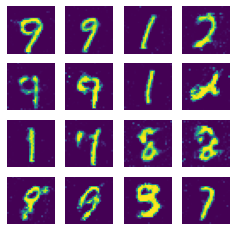

Epoch: 89


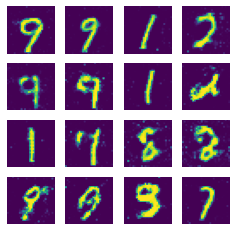

Epoch: 90


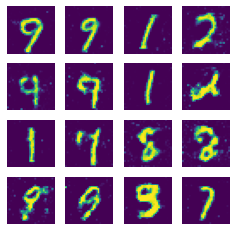

Epoch: 91


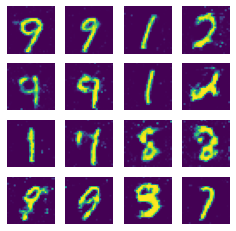

Epoch: 92


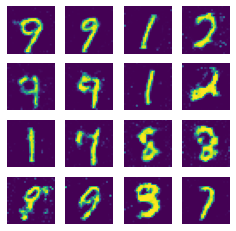

Epoch: 93


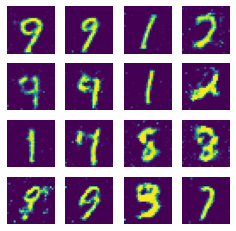

Epoch: 94


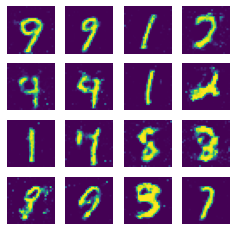

Epoch: 95


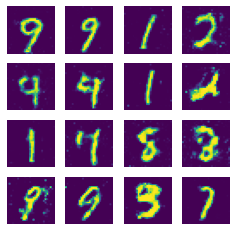

Epoch: 96


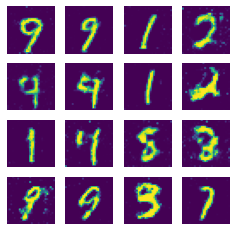

Epoch: 97


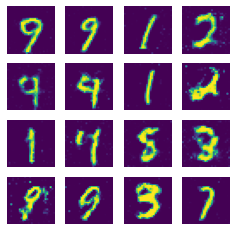

Epoch: 98


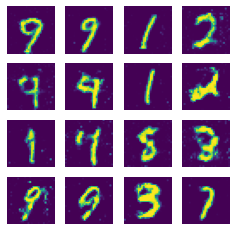

Epoch: 99


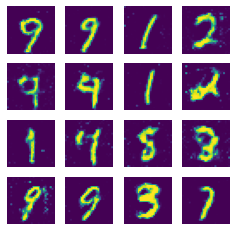

Epoch: 100


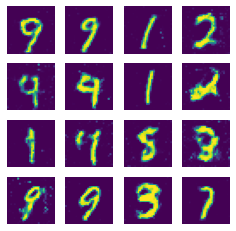

Epoch: 101


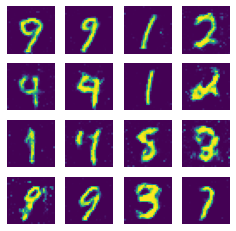

Epoch: 102


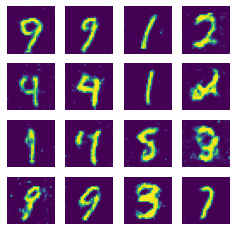

Epoch: 103


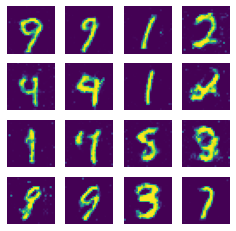

Epoch: 104


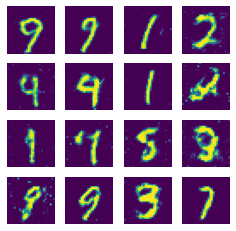

Epoch: 105


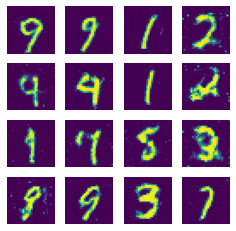

Epoch: 106


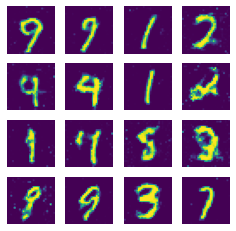

Epoch: 107


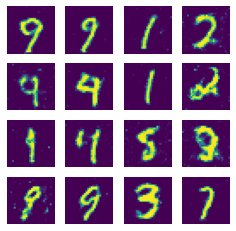

Epoch: 108


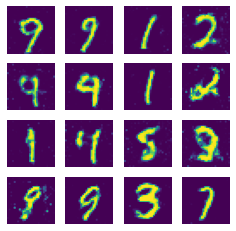

Epoch: 109


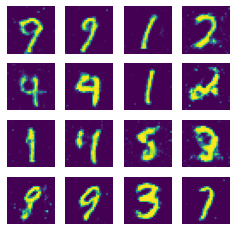

Epoch: 110


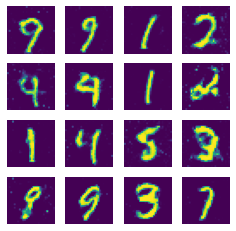

Epoch: 111


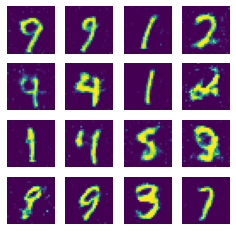

Epoch: 112


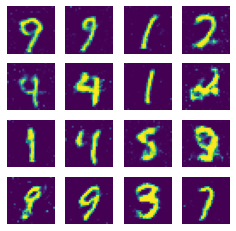

Epoch: 113


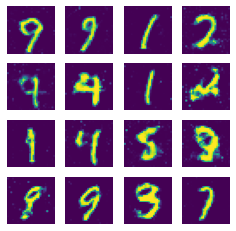

Epoch: 114


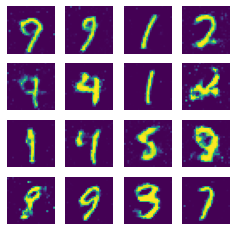

Epoch: 115


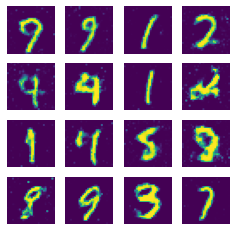

Epoch: 116


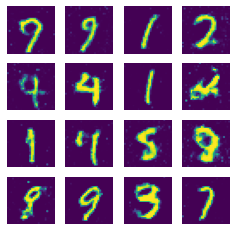

Epoch: 117


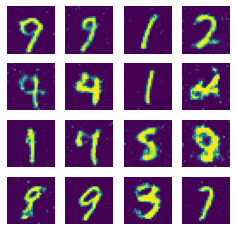

Epoch: 118


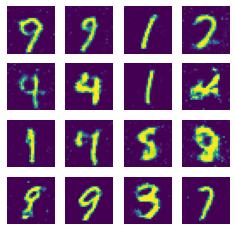

Epoch: 119


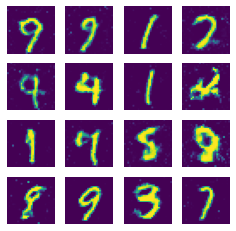

Epoch: 120


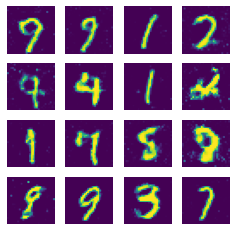

Epoch: 121


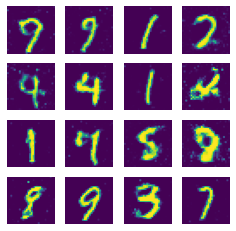

Epoch: 122


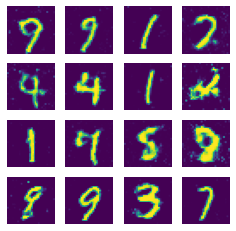

Epoch: 123


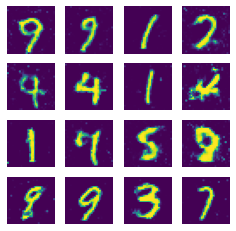

Epoch: 124


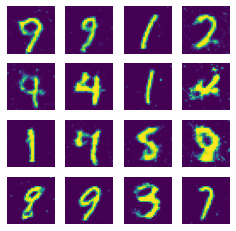

Epoch: 125


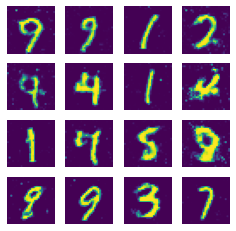

Epoch: 126


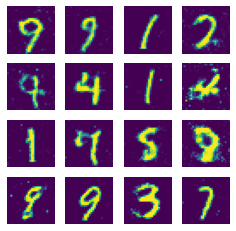

Epoch: 127


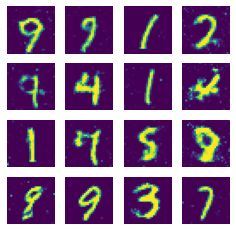

Epoch: 128


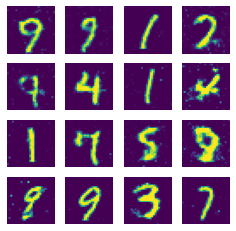

Epoch: 129


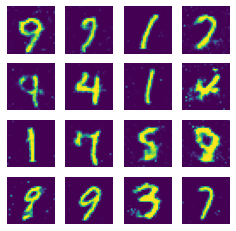

Epoch: 130


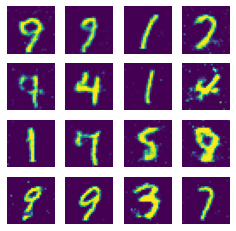

Epoch: 131


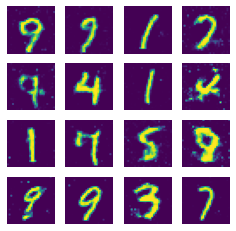

Epoch: 132


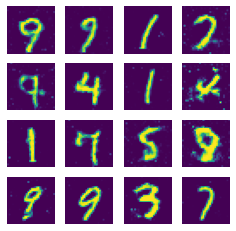

Epoch: 133


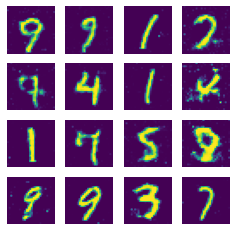

Epoch: 134


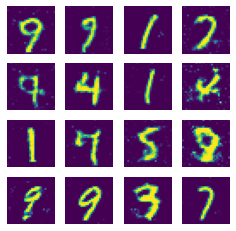

Epoch: 135


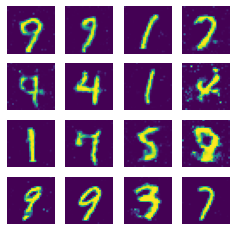

Epoch: 136


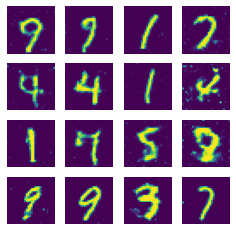

Epoch: 137


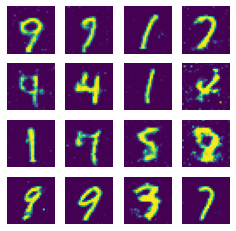

Epoch: 138


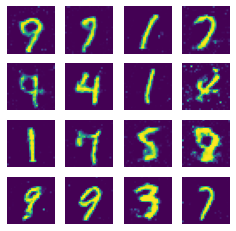

Epoch: 139


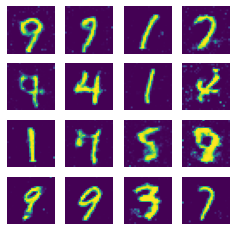

Epoch: 140


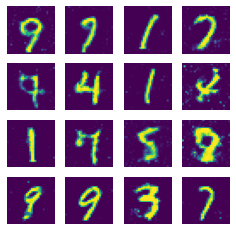

Epoch: 141


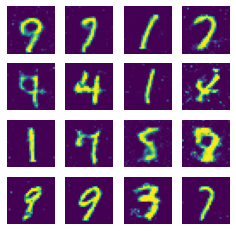

Epoch: 142


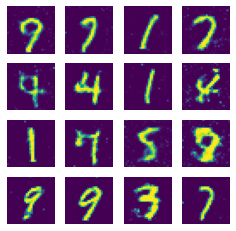

Epoch: 143


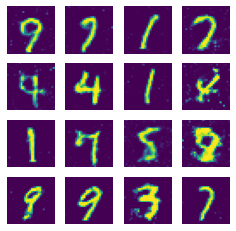

Epoch: 144


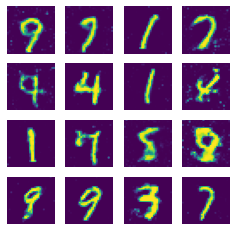

Epoch: 145


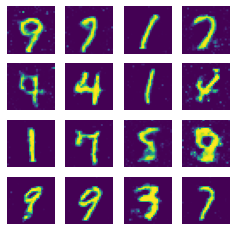

Epoch: 146


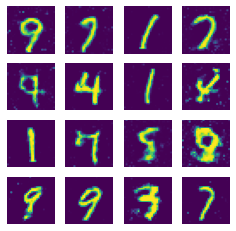

Epoch: 147


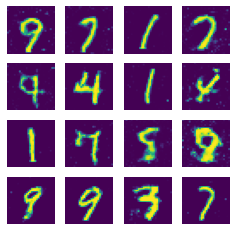

Epoch: 148


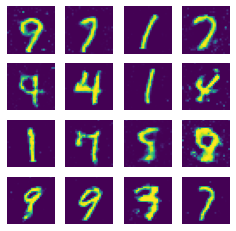

Epoch: 149


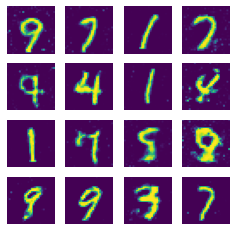

Epoch: 150


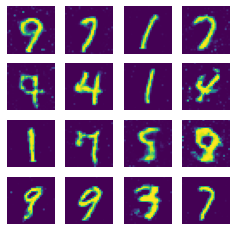

Epoch: 151


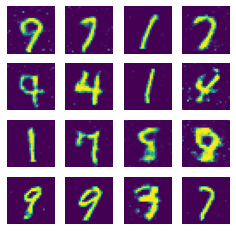

Epoch: 152


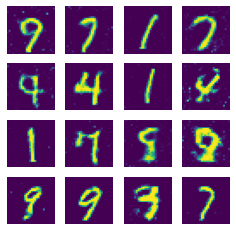

Epoch: 153


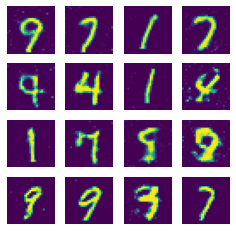

Epoch: 154


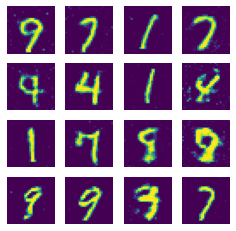

Epoch: 155


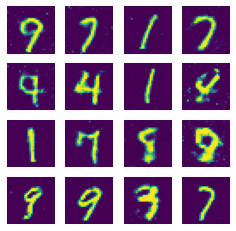

Epoch: 156


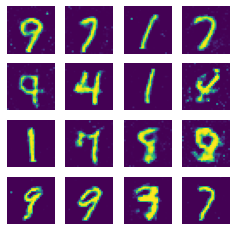

Epoch: 157


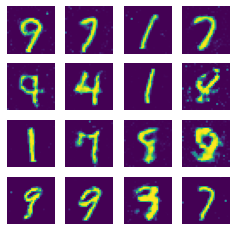

Epoch: 158


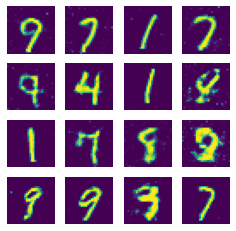

Epoch: 159


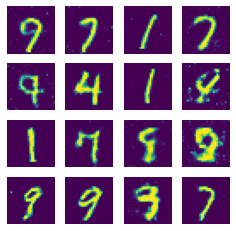

Epoch: 160


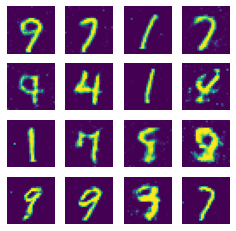

Epoch: 161


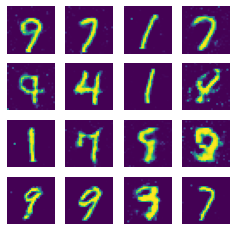

Epoch: 162


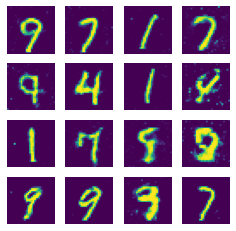

Epoch: 163


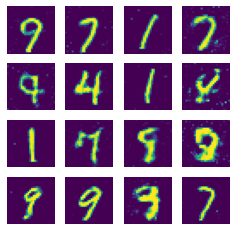

Epoch: 164


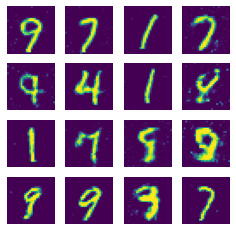

Epoch: 165


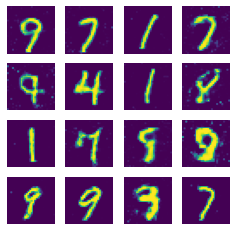

Epoch: 166


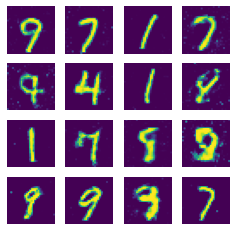

Epoch: 167


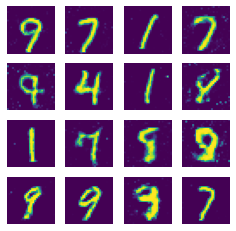

Epoch: 168


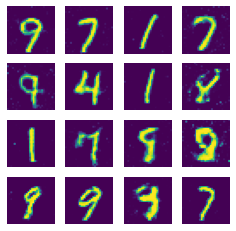

Epoch: 169


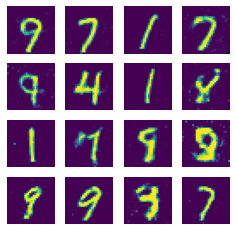

Epoch: 170


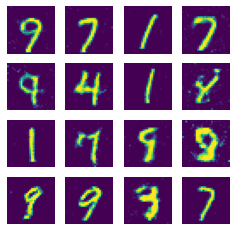

Epoch: 171


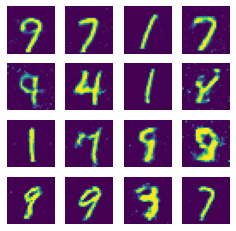

Epoch: 172


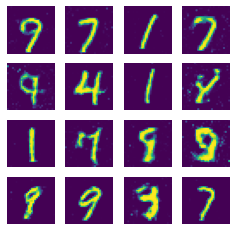

Epoch: 173


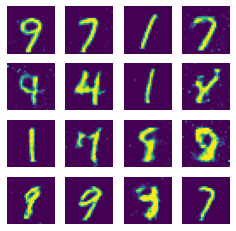

Epoch: 174


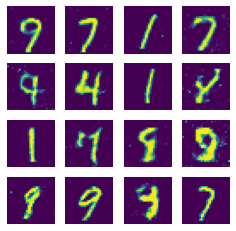

Epoch: 175


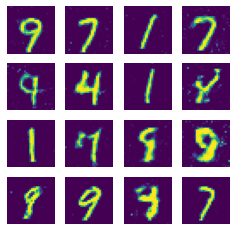

Epoch: 176


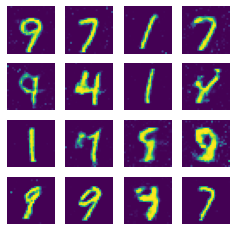

Epoch: 177


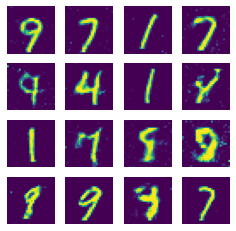

Epoch: 178


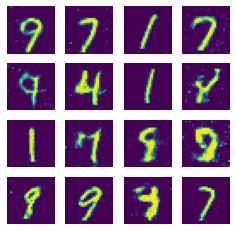

Epoch: 179


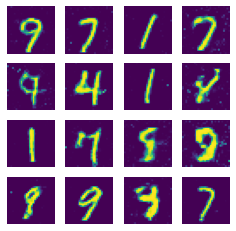

Epoch: 180


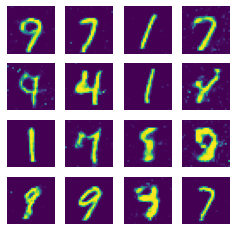

Epoch: 181


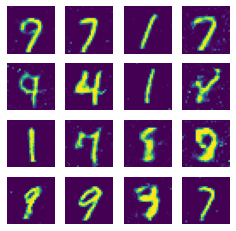

Epoch: 182


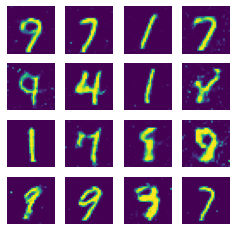

Epoch: 183


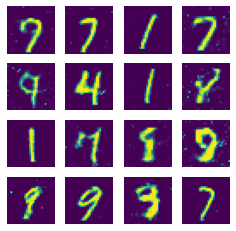

Epoch: 184


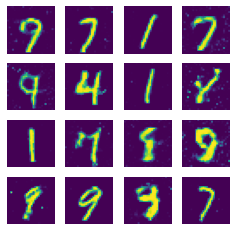

Epoch: 185


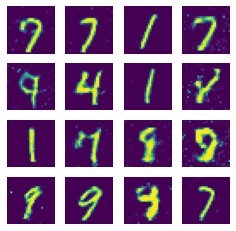

Epoch: 186


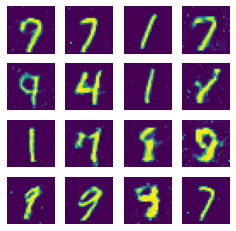

Epoch: 187


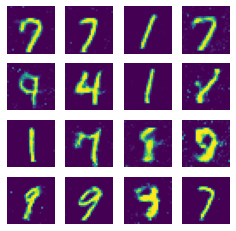

Epoch: 188


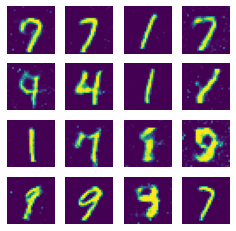

Epoch: 189


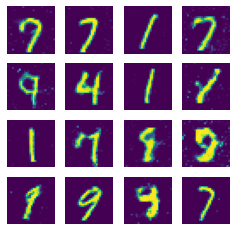

Epoch: 190


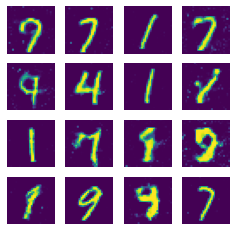

Epoch: 191


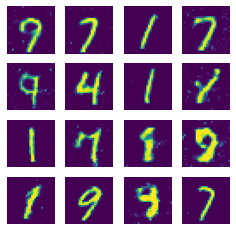

Epoch: 192


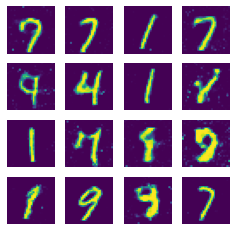

Epoch: 193


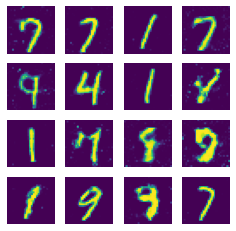

Epoch: 194


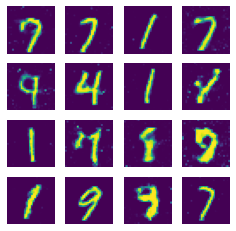

Epoch: 195


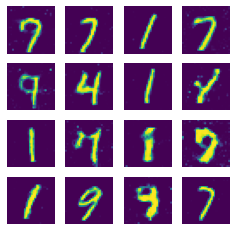

Epoch: 196


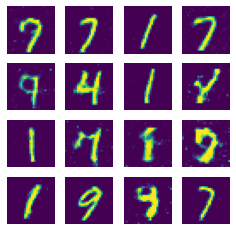

Epoch: 197


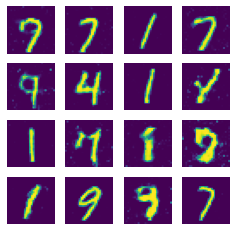

Epoch: 198


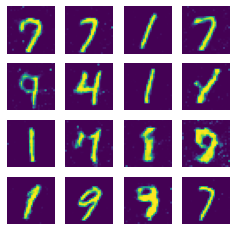

Epoch: 199


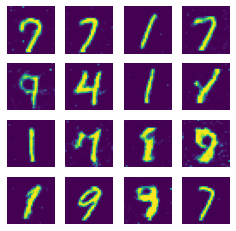

In [20]:
#训练循环：
for epoch in range(200):
    d_epoch_loss=0
    g_epoch_loss=0
    count=len(dataloader) #a=len(dataloader)会返回batch数，b=len(dataset)会返回样本总数 （b=a*batch_size）

    for step, (img, _) in enumerate(dataloader):#需要epoch号和图像，不需要标签
        img=img.to(device)#先把数据放到GPU上
        size=img.size(0)#相当于batch_size，生成这么多个随机数正好和一个批次的图像向对应
        random_noise=torch.randn(size,100,device=device)
        
        #判别器的损失
        d_optim.zero_grad() #对于判别器而言损失有两个部分,真实图像的损失和生成图像的损失
        real_output=dis(img) #判别器输入真实的图片，得到对真实图片的预测结果，我们希望real_output为1
        d_real_loss=loss_fn(real_output,#因为我们对真实图片希望输出结果是1，所以计算它和全1的数组
                    torch.ones_like(real_output)) #torch.ones_like(a)是输出a的样式那么多个1，如a是5*5的数组，这个就输出5*5的1
        d_real_loss.backward()

        gen_img=gen(random_noise)
        fake_output=dis(gen_img.detach())#判别器输入生成的图片，因为这里也是对判别器的训练，所以使用detach将梯度截取不影响gen的训练，使梯度不再传送到gen的模型中了
        d_fake_loss=loss_fn(fake_output,torch.zeros_like(fake_output))
        d_fake_loss.backward()

        d_loss=d_real_loss+d_fake_loss
        d_optim.step()

        #生成器的损失
        g_optim.zero_grad()
        fake_output=dis(gen_img) #此时就不需要截断了，因为此时就需要梯度来训练优化GAN
        g_loss=loss_fn(fake_output,torch.ones_like(fake_output)) #对于生成器我们希望判别器判断的的结果为1,就是希望生成的图片被判断为真
        g_loss.backward()
        g_optim.step()

        with torch.no_grad():#将每个epoch中批次的的所有loss求和
            d_epoch_loss+=d_loss
            g_epoch_loss+=g_loss
    with torch.no_grad():  #求每个epoch的平均loss再放到列表中
        d_epoch_loss/=count
        g_epoch_loss/=count
        D_loss.append(d_epoch_loss)
        G_loss.append(g_epoch_loss)
        print('Epoch:',epoch)
        gen_image_plot(gen,test_input)#使用一个固定的噪声而不是每个epoch都变的噪声从而更明显的看出来优化变化的结果




In [32]:
dloss=torch.tensor(D_loss,device='cpu')
gloss=torch.tensor(G_loss,device='cpu') #需要先将loss数据从GPU中取回到cpu中，否则无法画图

Text(0.5, 1.0, 'loss')

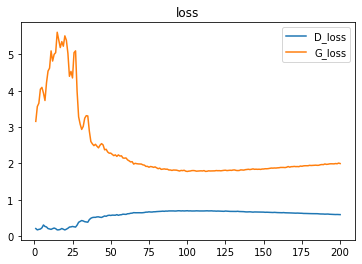

In [35]:
plt.plot(range(1,201),dloss,label='D_loss')
plt.plot(range(1,201),gloss,label='G_loss')
plt.legend()
plt.title('loss')

In [ ]:
pre=np.squeeze(gen(test_input).detach().cpu().numpy())
pre=(pre+1)/2

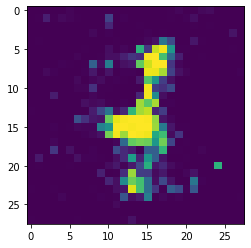

In [ ]:
plt.imshow(pre)

In [ ]:
a=torch.randn(3,4)

In [ ]:
a

tensor([[-0.1661, -0.1060,  0.3087,  0.0370],
        [ 1.0891,  0.1508, -1.9462,  2.1997],
        [-0.8923,  0.3454,  0.1466, -0.2837]])

In [ ]:
torch.ones_like(a)

tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]])